In [2]:
!pip -q install python_speech_features
!pip -q install modal

In [3]:
seed=42
import numpy as np
import pandas as pd
from scipy.stats import entropy
from modAL.models import ActiveLearner
from modAL.uncertainty import uncertainty_sampling

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import f1_score, recall_score
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import clear_output
from matplotlib import rc, cm
import tensorflow as tf
rc('font', size=12)
from math import sqrt
SPINE_COLOR = 'gray'

def format_axes(ax):

    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)

    for spine in ['left', 'bottom']:
        ax.spines[spine].set_color(SPINE_COLOR)
        ax.spines[spine].set_linewidth(0.5)

    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')

    for axis in [ax.xaxis, ax.yaxis]:
        axis.set_tick_params(direction='out', color=SPINE_COLOR)

    return ax

<h1><center>Active Learning: A Visual Tour</center></h1>
<h4><center>Zeel B Patel, IIT Gandhinagar, <a href="mailto:patel_zeel@iitgn.ac.in">patel_zeel@iitgn.ac.in</a>
     <br><br>
            <a href="https://nipunbatra.github.io/">Nipun Batra</a>, IIT Gandhinagar, <a href="mailto:nipun.batra@iitgn.ac.in">nipun.batra@iitgn.ac.in</a> </center></h4>

## Rise of Supervised Learning

Machine learning (ML) has penetrated all the fields that one can name. However, Supervised learning has a higher success rate than other techniques. [The AI Trinity](https://simons.berkeley.edu/events/openlectures2018-fall-1#:~:text=AI%20at%20scale%20requires%20a,data%2C%20algorithms%20and%20cloud%20infrastructure.&text=By%20building%20intelligence%20into%20data,to%20train%20models%20at%20scale.) (availability of massive data, better algorithms, and powerful computational infrastructure) are the major driving factors in the success of supervised learning.

In [4]:
from IPython.core.display import HTML
eval('HTML("""\
<style>\
.output_png {\
    display: table-cell;\
    text-align: center;\
    vertical-align: middle;\
}\
</style>\
""")')
#clear_output()

## Labeling the Data is Expensive

Supervised learning algorithms can work with labeled data only. Though, Annotating the data is expensive, because it may require: i) excessive time and manual effort ii) expensive sensors. Let us understand how expensive labeling is with a few examples.

### Speech Recognition

Let us say we want to convert a speech or audio into text for an application like subtitle generation (speech-to-text task). The annotator has to annotate each segment of the time window in the audio. The example audio of 6 seconds here may require around a minute to annotate manually. Thus, annotating millions of hours of publicly available audio data is an almost impossible task.

In [5]:
from IPython.display import Audio, display

In [6]:
# aud1 = Audio(url='https://raw.githubusercontent.com/patel-zeel/OpenActiveLearning/master/Audio/demo.wav')
aud1 = Audio(filename='../audio/demo.wav')
#!wget https://raw.githubusercontent.com/patel-zeel/OpenActiveLearning/master/Audio/demo.wav

In [7]:
display(aud1)

Similarly, researchers have made efforts to detect COVID-19 from the sound of the human cough [[AI4COVID-19]](https://www.sciencedirect.com/science/article/pii/S2352914820303026), where again, getting the correct labels is difficult.

Let us take another example.

### Human Activity Recognition

Let us say we want to classify different human activities into different categories (shown in the figure). We need expensive sensors to monitor the alignment or motion of the human body for such tasks. In the end, we need to map the sensor data with various activities with substantial manual effort.

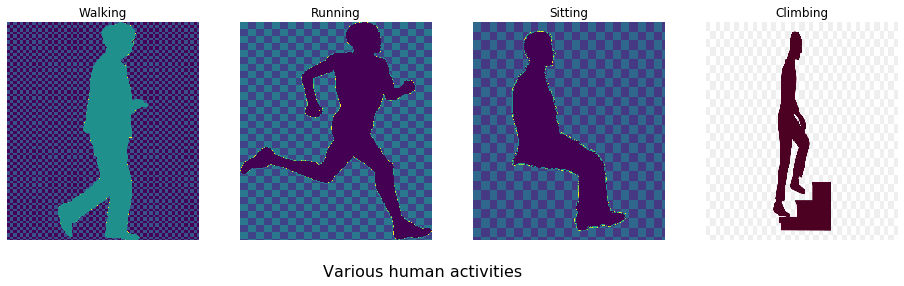

In [8]:
from PIL import Image
fig, axes = plt.subplots(1,4, figsize=(16,4))
for ax in axes:
    ax.set_axis_off()
axes[0].imshow(Image.open('../images/walk.png').resize((220,250)))
axes[0].set_title('Walking')
axes[1].imshow(Image.open('../images/run.png').resize((220,250)))
axes[1].set_title('Running')
axes[2].imshow(Image.open('../images/sit.png').resize((220,250)));
axes[2].set_title('Sitting')
axes[3].imshow(Image.open('../images/climb.jpg').resize((220,250)));
axes[3].set_title('Climbing')
plt.gcf().set_facecolor("white");
plt.figtext(0.4,0,'Various human activities',fontdict={'size':16});

## All the Samples are Not Equally Important

We know that increasing the training (labeled) data increases model performance. Though, all the samples do not have an equal role in improving the model. Let us understand this with a few examples.

### SVC Says: Closer is Better

We use an artificial two-class data set generated from a bivariate normal distribution. We train a Support Vector Classifier (SVC) model on a sample of this dataset (5 data points) and visualize the decision boundary.

In [8]:
from sklearn.svm import LinearSVR

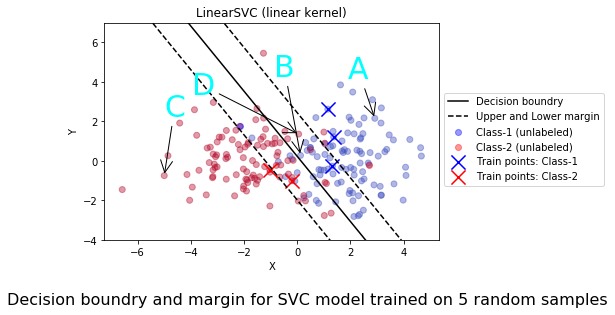

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm, datasets
np.random.seed(seed)

iris = datasets.load_iris()
X1 = np.random.multivariate_normal([2,0],np.eye(2)*2, size=100)
X2 = np.random.multivariate_normal([-2,0],np.eye(2)*2, size=100)
X = np.concatenate([X1, X2])
y = np.concatenate([np.zeros((100, 1)), np.ones((100, 1))]).squeeze()
np.random.seed(seed)
train_ind = np.random.choice(range(len(X)), size=5, replace=False)

h = .02  # step size in the mesh
C = 1.0 
clf = svm.LinearSVC(C=C).fit(X[train_ind], y[train_ind])

# get the separating hyperplane
w = clf.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(-6, 4)
yy = a * xx - (clf.intercept_[0]) / w[1]

# plot the parallels to the separating hyperplane that pass through the
# support vectors (margin away from hyperplane in direction
# perpendicular to hyperplane). This is sqrt(1+a^2) away vertically in
# 2-d.
margin = 1 / np.sqrt(np.sum(clf.coef_ ** 2))
yy_down = yy - np.sqrt(1 + a ** 2) * margin
yy_up = yy + np.sqrt(1 + a ** 2) * margin

# plot the line, the points, and the nearest vectors to the plane
#plt.clf()
plt.plot(xx, yy, 'k-',label='Decision boundry')
plt.plot(xx, yy_down, 'k--', label='Upper and Lower margin')
plt.plot(xx, yy_up, 'k--')
plt.ylim(-4,7)

# Plot also the training points

plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cm.coolwarm, alpha=0.4)
plt.scatter(X[:, 0][-1:], X[:, 1][-1:], c='b', alpha=0.4, label='Class-1 (unlabeled)')
plt.scatter(X[:, 0][0:1], X[:, 1][0:1], c='r', alpha=0.4, label='Class-2 (unlabeled)')
plt.scatter(X[:,0][train_ind][y[train_ind]==0], 
            X[:,1][train_ind][y[train_ind]==0], c='blue', s=200, marker='x',label='Train points: Class-1')
plt.scatter(X[:,0][train_ind][y[train_ind]==1], 
            X[:,1][train_ind][y[train_ind]==1], c='r', s=200, marker='x', label='Train points: Class-2')

arr = [1, 38, 19,191, 161, 186]
ii, ele = 0, arr[0]
plt.annotate(chr(ii+65), (X[ele,0], X[ele,1]), size=30, color='cyan', xycoords='data',
            xytext=(X[ele,0]-1, X[ele,1]+2), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3"))

ii, ele = 1, arr[2]
plt.annotate(chr(ii+65), (X[ele,0], X[ele,1]), size=30, color='cyan', xycoords='data',
            xytext=(X[ele,0]-1, X[ele,1]+4), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3", color='k'))
ii, ele = 2, arr[3]
plt.annotate(chr(ii+65), (X[ele,0], X[ele,1]), size=30, color='cyan', xycoords='data',
            xytext=(X[ele,0], X[ele,1]+3), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3"))

ii, ele = 3, arr[5]
plt.annotate(chr(ii+65), (X[ele,0], X[ele,1]), size=30, color='cyan', xycoords='data',
            xytext=(X[ele,0]-4, X[ele,1]+2), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3", color='k'))

# for i in range(150,200):
#     plt.annotate(str(i), (X[i,0], X[i,1]))

plt.xlabel('X')
plt.ylabel('Y')
#plt.xlim(xx.min(), xx.max())
#plt.ylim(yy.min(), yy.max())
plt.title('LinearSVC (linear kernel)')
plt.legend(bbox_to_anchor=(1,0.7))
plt.figtext(-0.1,-0.1,'Decision boundry and margin for SVC model trained on 5 random samples',fontdict={'size':16})

plt.show()

Support vector points help the SVC model to distinguish between various classes. Some instances in the above diagram are misclassified because we have used very few training points. Consider some candidate points A, B, C, and D from unlabeled data points. Point B or D is closer to the confusion area than Point A, or C. Thus, points B and D are more critical in improving the model if added to the train points.

### Confusion in Digit Classification

Let us consider the MNIST dataset (a well-known public dataset with labeled images of digits $0$ to $9$) for the classification task. We train the logistic regression model on a few random samples of the MNIST dataset. Let us see what our model learns with a stratified set of $50$ data points ($5$ samples for each class). We show the normalized confusion matrix over the test set having $10000$ samples.

In [10]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, confusion_matrix
import pandas as pd
import seaborn as sns

import tensorflow as tf
(train_pool_X, train_pool_y), (test_X, test_y) = tf.keras.datasets.mnist.load_data()
splitter = StratifiedKFold(1210)
for _, train_ind in splitter.split(train_pool_X, train_pool_y):
    train_X = train_pool_X[train_ind]
    train_y = train_pool_y[train_ind]
    break

In [11]:
model = RandomForestClassifier(random_state=seed)
model.fit(train_X.reshape(train_X.shape[0],-1), train_y)
pred_y = model.predict(test_X.reshape(test_X.shape[0], -1))
acc = f1_score(test_y, pred_y,labels=[0,1,2,3,4,5,6,7,8,9], average=None)
# fig, ax = plt.subplots()
# format_axes(ax);
# ax.bar(range(10), acc)
# ax.set_xlabel('Digit')
# #ax.grid(True)
# ax.set_xticks(range(10))
# ax.set_yticks(np.arange(0,1.1,0.1))
# ax.set_ylabel('F1-score\n(Higher is better)')
# plt.tight_layout()
# ax.set_title('Individual F1-score for each digit class')
# df = pd.DataFrame(np.zeros((1, 10)), columns=['Digit_'+str(i) for i in range(10)], index=['Train Ground Truth Frequency'], dtype='int')
# df.iloc[0] = pd.Series(train_y).value_counts().sort_index().values
# #df

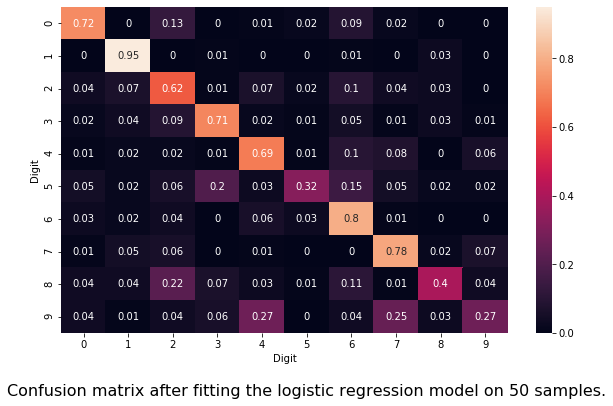

In [12]:
fig, ax = plt.subplots(figsize=(10, 6))
CM = confusion_matrix(test_y, pred_y)
sns.heatmap(np.round(CM/CM.astype(np.float).sum(axis=1),2), annot=True, ax=ax);
plt.figtext(0.05,-0.02,'Confusion matrix after fitting the logistic regression model on 50 samples.',
            fontdict={'size':16});ax.set_xlabel('Digit');ax.set_ylabel('Digit');

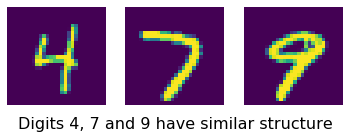

In [13]:
fig, ax = plt.subplots(1,3)
for i,j in enumerate([19,17,9]):
    ax[i].set_axis_off()
    ax[i].imshow(test_X[j].reshape(28,28))
plt.figtext(0.15,0.25,'Digits 4, 7 and 9 have similar structure',
            fontdict={'size':16});

We can see from the confusion matrix that few digits have more confusion than others. For example, the digit '1' is having almost no confusion; digit '9' is confused with '7' and '4'. This is because some digits are difficult to distinguish from the model's perspective. Thus, we may need more training examples for such digits to learn them correctly. Now, we will see a regression-based example.

### GP Needs 'Good' Data Points

We will consider a sine curve data with added noise. We take a few samples (8 samples) as train points, a few as candidate points, and rest as the test points. Candidate points are the potential train points.

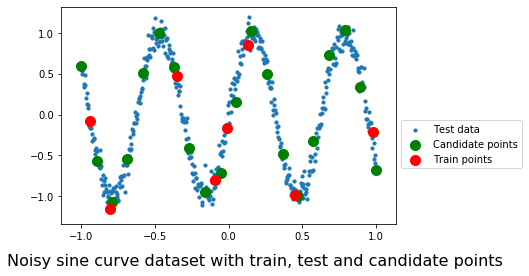

In [14]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel, WhiteKernel

np.random.seed(seed)
whole_X = np.linspace(-1,1,500).reshape(-1,1)
whole_y = np.sin(whole_X*10) + np.random.normal(size=whole_X.shape[0]).reshape(-1,1)/10
train_ind = np.random.choice(np.arange(500), size=8,replace=False)
np.random.seed(seed)
pool_ind = np.linspace(0,499,20).astype(int)
pool_X = whole_X[pool_ind]
pool_y = whole_y[pool_ind]
train_X = whole_X[train_ind]
train_y = whole_y[train_ind]
model = GaussianProcessRegressor(kernel=ConstantKernel(0.1)*(Matern(length_scale=0.1)+WhiteKernel(0.1)))
model.fit(train_X, train_y)
pred_y, var_y = model.predict(whole_X, return_cov=True)
fig, ax = plt.subplots()
ax.scatter(whole_X, whole_y, s=10, label='Test data')
ax.scatter(pool_X, pool_y, marker='o', s=100, color='g', label='Candidate points')
ax.scatter(train_X, train_y, marker='o', s=100, color='r', label='Train points')
ax.legend(bbox_to_anchor=(1,0.5));
plt.figtext(0,-0.02,'Noisy sine curve dataset with train, test and candidate points',fontdict={'size':16});

We will fit a GPR (Gaussian Process Regressor) model to our dataset with the [Matern](https://scikit-learn.org/stable/modules/generated/sklearn.gaussian_process.kernels.Matern.html) kernel. As the model output, we get predictive mean along with predictive variance. The predictive variance shows the confidence of the model about its predictions.

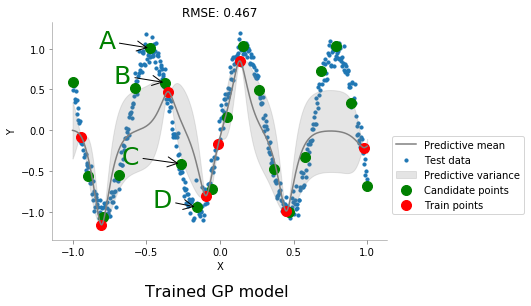

In [15]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel, WhiteKernel

np.random.seed(seed)
whole_X = np.linspace(-1,1,500).reshape(-1,1)
whole_y = np.sin(whole_X*10) + np.random.normal(size=whole_X.shape[0]).reshape(-1,1)/10
train_ind = np.random.choice(np.arange(500), size=8,replace=False)
np.random.seed(seed)
pool_ind = np.linspace(0,499,20).astype(int)
pool_X = whole_X[pool_ind]
pool_y = whole_y[pool_ind]
train_X = whole_X[train_ind]
train_y = whole_y[train_ind]
model = GaussianProcessRegressor(kernel=ConstantKernel(0.1)*(Matern(length_scale=0.1)+WhiteKernel(0.1)))
model.fit(train_X, train_y)
pred_y, var_y = model.predict(whole_X, return_cov=True)
fig, ax = plt.subplots()
ax.scatter(whole_X, whole_y, s=10, label='Test data')
ax.plot(whole_X, pred_y, color='grey', label='Predictive mean')
ax.fill_between(whole_X.squeeze(), pred_y.squeeze()-var_y.diagonal(), pred_y.squeeze()+var_y.diagonal(), 
                 alpha=0.2, label='Predictive variance',color='grey')
ax.scatter(pool_X, pool_y, marker='o', s=100, color='g', label='Candidate points')
ax.scatter(train_X, train_y, marker='o', s=100, color='r', label='Train points')
ax.legend(bbox_to_anchor=(1,0.5));
ii = 0
ax.annotate(chr(ii+65), (pool_X[5], pool_y[5]), size=25, color='g', xycoords='data',
            xytext=(pool_X[5]-0.35, pool_y[5]), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3"))
ii = 1; iii = 6
ax.annotate(chr(ii+65), (pool_X[iii], pool_y[iii]), size=25, color='g', xycoords='data',
            xytext=(pool_X[iii]-0.35, pool_y[iii]), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3"))
ii = 2; iii = 7
ax.annotate(chr(ii+65), (pool_X[iii], pool_y[iii]), size=25, color='g', xycoords='data',
            xytext=(pool_X[iii]-0.40, pool_y[iii]), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3"))
ii = 3; iii = 8
ax.annotate(chr(ii+65), (pool_X[iii], pool_y[iii]), size=25, color='g', xycoords='data',
            xytext=(pool_X[iii]-0.30, pool_y[iii]), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3"));
ax.set_xlabel('X');ax.set_ylabel('Y');
ax.set_title('RMSE: '+str(np.round(np.sqrt(np.mean((pred_y.squeeze()- whole_y.squeeze())**2)),3)));
plt.figtext(0.34,-0.07,'Trained GP model',fontdict={'size':16})
format_axes(ax);

We can observe that uncertainty (predictive variance) is higher at distant points from the train points. Let us consider a set {A, B, C, D}, and check if they are equally useful for the model.

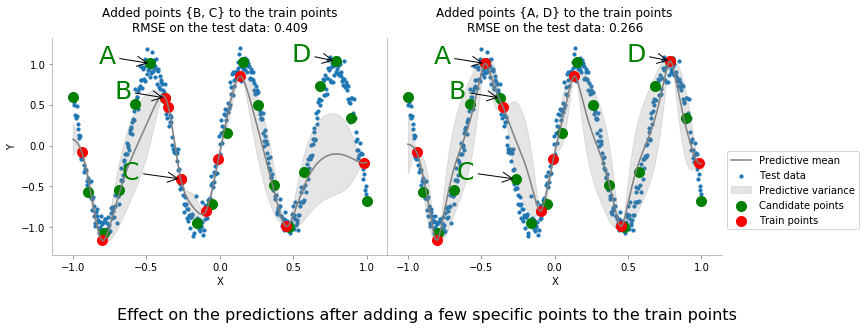

In [16]:
fig, ax = plt.subplots(1,2, figsize=(12,4))
rms = []
for n_i, (n1, n2) in enumerate([[6,7], [5,-3]]):
  model = GaussianProcessRegressor(kernel=ConstantKernel(0.1)*(Matern(length_scale=0.1)+WhiteKernel(0.1)))
  new_train_X = np.array(train_X.tolist() + [pool_X[n1], pool_X[n2]])
  new_train_y = np.array(train_y.tolist() + [pool_y[n1], pool_y[n2]])
  model.fit(new_train_X, new_train_y)
  pred_y, var_y = model.predict(whole_X, return_cov=True)
  ax[n_i].scatter(whole_X, whole_y, s=10, label='Test data')
  ax[n_i].plot(whole_X, pred_y, color='grey', label='Predictive mean')
  ax[n_i].fill_between(whole_X.squeeze(), pred_y.squeeze()-var_y.diagonal(), 
                       pred_y.squeeze()+var_y.diagonal(), alpha=0.2, label='Predictive variance',color='grey')
  ax[n_i].scatter(pool_X, pool_y, marker='o', s=100, color='g', label='Candidate points')
  ax[n_i].scatter(new_train_X, new_train_y, marker='o', s=100, color='r', label='Train points')
  ii = 0
  ax[n_i].annotate(chr(ii+65), (pool_X[5], pool_y[5]), size=25, color='g', xycoords='data',
              xytext=(pool_X[5]-0.35, pool_y[5]), textcoords='data',
              arrowprops=dict(arrowstyle="->",
                              connectionstyle="arc3"))
  ii = 1; iii = 6
  ax[n_i].annotate(chr(ii+65), (pool_X[iii], pool_y[iii]), size=25, color='g', xycoords='data',
              xytext=(pool_X[iii]-0.35, pool_y[iii]), textcoords='data',
              arrowprops=dict(arrowstyle="->",
                              connectionstyle="arc3"))
  ii = 2; iii = 7
  ax[n_i].annotate(chr(ii+65), (pool_X[iii], pool_y[iii]), size=25, color='g', xycoords='data',
              xytext=(pool_X[iii]-0.40, pool_y[iii]), textcoords='data',
              arrowprops=dict(arrowstyle="->",
                              connectionstyle="arc3"))
  ii = 3; iii = -3
  ax[n_i].annotate(chr(ii+65), (pool_X[iii], pool_y[iii]), size=25, color='g', xycoords='data',
              xytext=(pool_X[iii]-0.30, pool_y[iii]), textcoords='data',
              arrowprops=dict(arrowstyle="->",
                              connectionstyle="arc3"));
  rms.append(np.round(np.sqrt(np.mean((pred_y.squeeze()- whole_y.squeeze())**2)),3))
ax[0].set_title('Added points {B, C} to the train points\nRMSE on the test data: '+str(rms[0]));
ax[1].set_title('Added points {A, D} to the train points\nRMSE on the test data: '+str(rms[1]));
ax[1].legend(bbox_to_anchor=(1,0.5));
ax[0].set_ylabel('Y');
ax[1].set_yticks(())
ax[1].set_xlabel('X');ax[0].set_xlabel('X');
plt.subplots_adjust(wspace=.0);
plt.figtext(0.2,-0.1,'Effect on the predictions after adding a few specific points to the train points',fontdict={'size':16})
format_axes(ax[0]);format_axes(ax[1]);

One can claim that adding points {A, D} to the train set is better than adding points {B, C} from RMSE, and predictive variance. Note that adding points to the train set is the same as labeling unlabeled data and using them for training. One may either have an intelligent way to choose these 'good' points or randomly choose some points and label them. Active Learning techniques can help us determine the 'good' points, which are likely to improve our model. Now, we will discuss Active Learning techniques in detail.

## The Basics of Active Learning

Wikipedia quotes the definition of Active Learning as the following, 
* 'Active learning is a special case of machine learning in which a learning algorithm can interactively query a user (or some other information source) to label new data points with the desired outputs.' 

The below diagram illustrates the general flow of Active Learning.

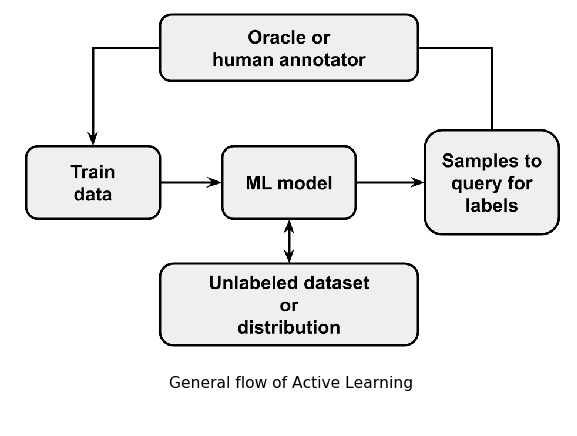

In [17]:
plt.figure(figsize=(12,8),dpi=70)
plt.imshow(Image.open("../images/AL basics.png"))
plt.axis('off');
plt.figtext(0.37,0.2,'General flow of Active Learning',fontdict={'size':16});

As shown in the flow diagram, the model sends a few samples to the oracle (human annotator or data source) from an unlabeled pool or distribution for labeling. The samples are chosen intelligently by some criteria. Thus, Active Learning is also called as optimal experimental design in other words [[link](http://eprints.sics.se/3600/)].

### Random Baseline

An ML model can randomly sample data points and send them to an oracle for labeling. Random sampling will also eventually result in capturing the global distribution in the train points. However, Active Learning aims to improve the model by intelligently selecting the data points for labeling. Thus, Random sampling is an appropriate baseline to compare with Active Learning.

## Different Scenarios for Active Learning

We have mainly three different scenarios of Active Learning:
1. **Membership Query Synthesis**: In this scenario, the model has an underlying distribution of data points from where it can generate the samples. The generated samples are sent to the Oracle for labeling.
1. **Stream-Based Selective Sampling**: We have a live stream of online data samples, and for each incoming sample model can choose to query for it or discard it based on some criteria.
1. **Pool-Based Sampling**: In this case, we already have a pool of unlabeled samples. Based on some criteria, model queries for a few samples. 

The pool-based sampling scenario is suitable for most of the real-world applications. Considering the space and time constraint, we restrict our article on the pool-based sampling only.

## Pool-Based Sampling

If we already have an unlabeled data set pool, we can query the data points with the following methods:
1. **Uncertainty Sampling**: We query the samples based on the model's uncertainty about the predictions. 
1. **Query by Committee**: In this approach, we create a committee of two or more models.  The Committee queries for the samples where predictions disagree the most among themselves.

We will demonstrate each of the above strategies with examples in the subsequent sections.

### Uncertainty Sampling

There are different approaches for the Classification and Regression tasks in Uncertainty sampling. We will go through them one by one with examples here.

#### Classification of Digits in the MNIST Dataset

The MNIST dataset is a well-known dataset having thousands of different images of digits 0 to 9. We have shown some examples here.

In [18]:
from sklearn.metrics import mean_squared_error
def individual_acc(pred_yy):
    #fig, ax = plt.subplots()
    ind_acc = np.array([np.inf]*len(set(test_y)))
    for each in range(len(set(test_y))):
        ind_acc[each] = f1_score(test_y, pred_yy, labels=[each], average=None)
        #ind_acc[each] = recall_score(test_y, pred_yy, labels=[each], average=None)
    return ind_acc.squeeze()

def overall_rmse(pred_y):
    rmse = []
    for preds in pred_y:
        rmse.append(mean_squared_error(test_y, preds, squared=False))
    return rmse

def overall_acc(pred_y):
    acc = []
    for preds in pred_y:
        acc.append(f1_score(test_y, preds, average='macro'))
    return acc


def plot_samples(X, ax):
    ax.set_axis_off()
    upper = np.hstack([x.reshape(28,28) for x in X[:5]])
    lower = np.hstack([x.reshape(28,28) for x in X[5:]])
    final = np.vstack([upper, lower])
    ax.imshow(final)
    ax.set_title('Queried samples')
    return ax

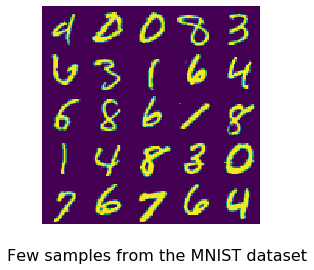

In [19]:
np.random.seed(seed)
(train_pool_X, train_pool_y), (test_X, test_y) = tf.keras.datasets.mnist.load_data()
train_X, Pool_X, train_y,  Pool_y = train_test_split(train_pool_X, train_pool_y, train_size=50, random_state=seed)

stack = []
for i in range(5):
    inds = np.random.choice(np.arange(len(train_pool_X)), size=5)
    stack.append(np.hstack(train_pool_X[inds]))
final = np.vstack(stack)
plt.axis('off')
plt.imshow(final)
plt.figtext(0.18,0,'Few samples from the MNIST dataset',fontdict={'size':16});

train_pool_X = train_pool_X.reshape(train_pool_X.shape[0], -1)
train_X = train_X.reshape(train_X.shape[0], -1)
test_X = test_X.reshape(test_X.shape[0], -1)
Pool_X = Pool_X.reshape(Pool_X.shape[0], -1)

We will now fit the Random Forest Classifier model (an ensemble model consisting of multiple Decision Tree Classifiers) on a few random samples (50 samples) and visualize the predictions. We will explain different ways to perform uncertainty sampling using the predictions.

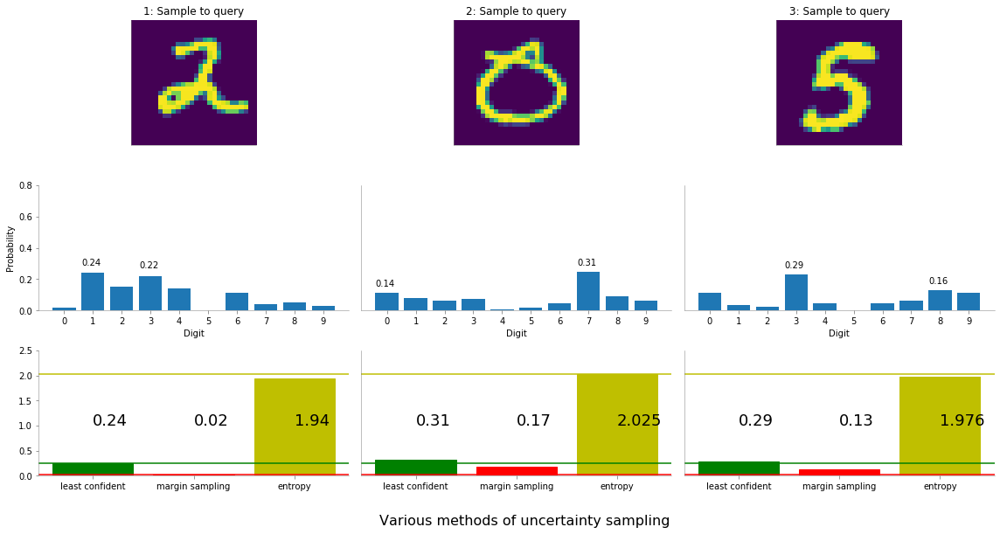

In [20]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(random_state=seed)
model.fit(train_X, train_y)
proba = model.predict_proba(test_X)
p = np.argsort([entropy(p) for p in proba])[::-1]
q = np.argsort([max(p) for p in proba])[::-1]
r = np.argsort([sorted(p)[-1]-sorted(p)[-2] for p in proba])[::-1]
fig, ax = plt.subplots(3, 3, figsize=(16,8))
ii = 5000
i_list = [p[ii], q[ii], r[ii]]
plt.subplots_adjust(wspace=0.)
for i,img_i in enumerate(i_list):
    ax[0, i].imshow(test_X[img_i].reshape(28, 28))
    ax[0, i].set_yticks(());ax[0, i].set_xticks(())
    ax[0, i].set_title(str(i+1)+': Sample to query')
    ax[1, i].bar(range(10), proba[img_i])
    ax[1, i].set_xticks(range(10));ax[1, 0].set_yticks(np.arange(0,1,0.2));ax[1, max(1,i)].set_yticks(())
    ax[1, max(1,i)].set_ylim(0,1)
    #ax[1, i].grid(True)
    ax[1, i].set_xlabel('Digit');ax[1, 0].set_ylabel('Probability');
    l = max(proba[img_i])
    m = sorted(proba[img_i])[-1] - sorted(proba[img_i])[-2]
    e = entropy(proba[img_i])
    l_a = np.argmax(proba[img_i])
    l_b = np.argsort(proba[img_i])[-2]
    ax[1, i].annotate(np.round(l,2),(l_a-0.4,np.round(l,2)+0.05))
    ax[1, i].annotate(np.round(sorted(proba[img_i])[-2],2),(l_b-0.4,np.round(sorted(proba[img_i])[-2],2)+0.05))
    ax[2, i].axhline(entropy(proba[i_list[1]]), color='y')
    img_im = i_list[0]
    img_il = i_list[0]
    ax[2, i].axhline(max(proba[img_il]), color='g')
    ax[2, i].axhline(sorted(proba[img_im])[-1] - sorted(proba[img_im])[-2], color='r')
    ax[2, i].set_ylim(0,2.5);ax[2, max(1,i)].set_yticks(())
    b_l = ax[2, i].bar(['least confident','margin sampling','entropy'], [l, m, e])
    b_l[0].set_color('g')
    b_l[1].set_color('r')
    b_l[2].set_color('y')
    ax[2, i].annotate(str(np.round(l,3)),(0, 1),size=18);ax[2, i].annotate(str(np.round(m, 3)),(1, 1),size=18)
    ax[2, i].annotate(str(np.round(e,3)),(2, 1),size=18)
    format_axes(ax[0, i]);format_axes(ax[1, i]);format_axes(ax[2, i]);
    #ax[2, i].set_xlim(0,3)

plt.figtext(0.38,-0.05,'Various methods of uncertainty sampling',fontdict={'size':16});
plt.tight_layout();

Above are the model predictions in terms of probability for a few random test samples. We can use different uncertainty strategies as the following.
1. **Least confident**: In this method, we choose samples for which the most probable class's probability is minimum. In the above example, sample 1 is least confident about its highest probable class digit '4'. So, we will choose sample 1 among all for labeling using this approach.

1. **Margin sampling**: In this method, we choose samples for which the difference between the probability of the most probable class and the second most probable class is minimum. In the above example, sample 1 has the least margin; thus, we will choose sample 1 for labeling using this approach.

1. **Entropy**: Entropy can be calculated for N number of classes using the following equation, where $P(x_i)$ is predicted probability for $i^{th}$ class. 
\begin{equation}
H(X) = -\sum\limits_{i=0}^{N}P(x_i)log_2P(x_i)
\end{equation}
Entropy is likely to be more if the probability is distributed over all classes. Thus, we can say that if entropy is more, the model is more confused among all classes.
For the above example, sample 2 has the highest entropy in predictions. So, we can choose the same for labeling.

We will now see the effect of Active Learning with these strategies on test data (contains 10000 samples). We will continue using the Random Forest Classifier model for this problem. We start with 50 samples as the initial train set and add 100 actively chosen samples over 100 iterations.

In [21]:
from modAL.uncertainty import uncertainty_sampling, margin_sampling, entropy_sampling
from multiprocessing import Pool
from IPython.display import clear_output
np.random.seed(seed)
N = 100
C = 1

def random_sampling(clf, X, *args):
    ind = [np.random.choice(range(len(X)))]
    return ind, X[ind]
    
def run(x):
  s_i, strategy = x
  list_pred_y = {s_i:[]}
  list_new_X = {s_i:[]}
  Pool_X_tmp, Pool_y_tmp = Pool_X.copy(), Pool_y.copy()
  train_X_tmp, train_y_tmp = train_X.copy(), train_y.copy()
  learner = ActiveLearner(estimator=RandomForestClassifier(random_state=seed), 
                        query_strategy=strategy, 
                       X_training=train_X_tmp, y_training=train_y_tmp)

  for i in range(N):
      print(s_i, i)
      clear_output(wait=True)
      pred_y = learner.predict(test_X)
      list_pred_y[s_i].append(pred_y)
      new_inds, new_X = learner.query(Pool_X_tmp, C)
      list_new_X[s_i].append(new_X)
      learner.teach(Pool_X_tmp[new_inds], Pool_y_tmp[new_inds])
      Pool_X_tmp, Pool_y_tmp = np.delete(Pool_X_tmp, new_inds, axis=0), np.delete(Pool_y_tmp, new_inds, axis=0)
  return (list_pred_y, list_new_X)

ans = [run((si,st)) for si,st in enumerate([uncertainty_sampling, margin_sampling, 
                                            entropy_sampling, random_sampling])]
list_pred_y = {i:ans[i][0][i] for i in range(4)}
list_new_X = {i:ans[i][1][i] for i in range(4)}
clear_output()

In [22]:
fig = plt.figure(figsize=(15,6))
ax = np.empty((3,4)).astype(np.object)
ij = 1
for i in range(3):
  ax[i,0] = fig.add_subplot(3, 4, ij)
  ij += 1
  for j in range(1,4):
    ax[i,j] = fig.add_subplot(3, 4, ij, sharey = ax[i,0])
    ij += 1

plt.subplots_adjust(wspace=0.3, hspace=0.5)
def iter(i):
    colrs = ['r','g','b','y']
    for s_i, s_name in enumerate(['least_confident', 'margin_sampling', 'entropy', 'random']):
      print(i)
      clear_output(wait=True)
      ax[0, s_i].cla()
      ax[1, s_i].cla()
      ax[2, s_i].cla()
      ax[0, s_i].set_title(str(s_i)+': '+s_name, color=colrs[s_i])
      ax[0, s_i].set_xlabel('Digit')
      ax[0, 0].set_ylabel('Individual F1-score')
      ax[2, s_i].set_xlabel('Iterations')
      ax[2, 0].set_ylabel('Overall F1-score')
      ax[0, s_i].set_xticks(range(10))
      ax[0, s_i].set_yticks(np.linspace(0,1,5))
      #ax[1, s_i].set_ylim(0,28)
      #ax[2, s_i].set_ylim(0.4, 0.6)
      ax[0, s_i].grid(True)
      ax[2, s_i].grid(True)
      ax[0, s_i].set_ylim(0,1)
      ax[0, s_i].bar(range(10), individual_acc(list_pred_y[s_i][i]), color=colrs[s_i])
      ax[1, s_i].imshow(list_new_X[s_i][i].reshape(28,28))
      ax[1, s_i].set_xticks(())
      ax[1, s_i].set_yticks(())
      ax[1, s_i].set_xlabel('Queried sample')
      ax[2, s_i].plot(range(1,i+1), overall_acc(list_pred_y[s_i][:i]), 'o-', color=colrs[s_i], markersize=3)
      ax[2, s_i].set_ylim(0.5,0.9)
      #ax[2, s_i].legend()
      
plt.legend()

plt.close()
anim = FuncAnimation(fig, iter, frames=range(100))
rc('animation', html='jshtml')
anim

The above animation shows individual F1-scores and overall F1-scores for all digits after each iteration. We can see that each of the strategies, except random sampling, tends to choose more samples of a digit class having a lower F1-score. Margin sampling performs better than the other strategies in terms of F1-score. Margin sampling and Least confident method easily outperform the random baseline. The entropy method, in this case, is comparable to the random baseline. The Figure below shows a comparison of all strategies.

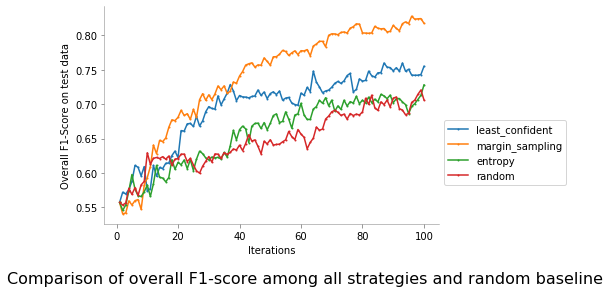

In [23]:
fig, ax = plt.subplots()
for s_i, s_name in enumerate(['least_confident', 'margin_sampling', 'entropy', 'random']):
  ax.plot(range(1,N+1), overall_acc(list_pred_y[s_i]), 'o-',label=s_name, markersize=1)
ax.set_xlabel('Iterations');ax.set_ylabel('Overall F1-Score on test data')
ax.legend(bbox_to_anchor=(1, 0.5));
plt.figtext(-0.1,-0.08,'Comparison of overall F1-score among all strategies and random baseline',fontdict={'size':16})
format_axes(ax);

Thus far, we have seen uncertainty for classification tasks. Now, we will take an example of regression to explain uncertainty sampling.

#### Regression on Noisy Sine Curve 

We consider the sine curve dataset we've used earlier for this task. We fit the Gaussian Process regressor model with [Matern kernel](https://scikit-learn.org/stable/modules/generated/sklearn.gaussian_process.kernels.Matern.html) on randomly selected 5 data points. Uncertainty measure for the regression tasks is the standard deviation or the predictive variance. In this example, we will take predictive variance as our measure of uncertainty.

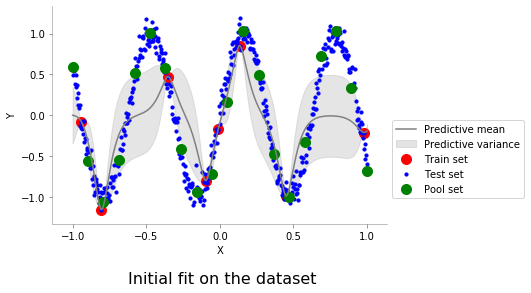

In [24]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel, WhiteKernel

np.random.seed(seed)
whole_X = np.linspace(-1,1,500).reshape(-1,1)
whole_y = np.sin(whole_X*10) + np.random.normal(size=whole_X.shape[0]).reshape(-1,1)/10
train_ind = np.random.choice(np.arange(500), size=8,replace=False)
pool_ind = np.linspace(0,499,20).astype(int)
pool_X = whole_X[pool_ind]
pool_y = whole_y[pool_ind]
train_X = whole_X[train_ind]
train_y = whole_y[train_ind]
test_X, test_y = whole_X.copy(), whole_y.copy()
model = GaussianProcessRegressor(kernel=ConstantKernel(0.1)*(Matern(length_scale=0.1)+WhiteKernel(0.1)))
model.fit(train_X, train_y)
pred_y, var_y = model.predict(whole_X, return_cov=True)
fig, ax = plt.subplots()
ax.fill_between(whole_X.squeeze(), pred_y.squeeze()-var_y.diagonal(), 
                 pred_y.squeeze()+var_y.diagonal(), alpha=0.2, label='Predictive variance',color='grey')
ax.scatter(train_X, train_y, label='Train set',s=100,c='r')
ax.plot(whole_X, pred_y, label='Predictive mean', c='grey')
ax.scatter(whole_X, whole_y, label='Test set',s=10,c='b')
ax.scatter(pool_X, pool_y, label='Pool set',s=100,c='g')
ax.legend(bbox_to_anchor=(1,0.5));
ax.set_xlabel('X');ax.set_ylabel('Y');
plt.figtext(0.3,-0.08,'Initial fit on the dataset',fontdict={'size':16})
format_axes(ax);

As per uncertainty criteria, samples with predictive variance should be queried for a label. Now, we will show a comparison of uncertainty sampling with the random baseline for ten iterations. We are also showing the next sample to query at each iteration.

In [25]:
list_pred_y_gp = {0:[], 1:[]}
list_var_y_gp = {0:[], 1:[]}
list_new_X_gp = {0:[], 1:[]}
list_new_y_gp = {0:[], 1:[]}
list_new_model = {0:[], 1:[]}
np.random.seed(seed)
N=10
def GP_regression_std(regressor, X):
    _, std = regressor.predict(X, return_std=True)
    query_idx = np.argmax(std)
    return [query_idx], X[[query_idx]]
def GP_regression_random(regressor, X):
    query_idx = np.random.choice(range(len(X)))
    return [query_idx], X[[query_idx]]

for s_i, q_func in enumerate([GP_regression_std, GP_regression_random]):
    pool_X_tmp, pool_y_tmp = pool_X.copy(), pool_y.copy()
    train_X_tmp, train_y_tmp = train_X.copy(), train_y.copy()
    learner = ActiveLearner(
        estimator=GaussianProcessRegressor(kernel=ConstantKernel(0.1)*(Matern(length_scale=0.1)+WhiteKernel(0.1)), random_state=seed),
        query_strategy=q_func,
        X_training=train_X_tmp, y_training=train_y_tmp
    )
    for i in range(N):
        print(s_i, i)
        clear_output(wait=True)
        pred_y, var_y = learner.predict(whole_X, return_cov=True)
        list_pred_y_gp[s_i].append(pred_y)
        list_var_y_gp[s_i].append(var_y)
        new_ind, new_X = learner.query(pool_X_tmp)
        list_new_X_gp[s_i].append(new_X[0])
        list_new_y_gp[s_i].append(pool_y_tmp[new_ind][0])
        learner.teach(new_X, pool_y_tmp[new_ind])
        pool_X_tmp, pool_y_tmp = np.delete(pool_X_tmp, new_ind, axis=0), np.delete(pool_y_tmp, new_ind, axis=0)
        
clear_output()

In [26]:
fig, ax = plt.subplots(2,2, figsize=(12,8))
plt.subplots_adjust(wspace=0.04)
def iter_gp(i):
    ax[0,0].cla()
    ax[1,0].cla()
    ax[0,1].cla()
    ax[1,1].cla()
    for s_i, s_name in enumerate(['Uncertainty sampling', 'Random sampling']):
        pred_y, var_y = list_pred_y_gp[s_i][i], list_var_y_gp[s_i][i]
        ax[0, s_i].fill_between(whole_X.squeeze(), pred_y.squeeze()-var_y.diagonal(), 
                                pred_y.squeeze()+var_y.diagonal(), alpha=0.2, label='Predictive variance')
        ax[0, s_i].scatter(pool_X, pool_y,s=10,c='g')
        ax[0, s_i].plot(whole_X, pred_y,label='Predictive mean')
        ax[0, s_i].scatter(whole_X, whole_y,s=10,c='b',label='Test data')
        ax[0, s_i].set_ylim(-1.5,2.5);ax[0, 1].set_yticks(())
        ax[0, s_i].set_xlabel('X');ax[0, 0].set_ylabel('Y');
        ax[0, s_i].set_title(s_name)
        #ax[1, s_i].grid(True)
        ax[1, s_i].plot(range(1,i+2), overall_rmse(list_pred_y_gp[s_i][:i+1]), 'o-', label=s_name)
#         for x_iii, yyy in enumerate(overall_rmse(list_pred_y_gp[s_i][:i]), 1):
#             ax[1, s_i].annotate(np.round(yyy,2), (x_iii-0.5, yyy+0.5*((-1)**x_iii)))
        ax[1, s_i].set_xlabel('Iterations');ax[1, 0].set_ylabel('RMSE');
        ax[0, s_i].scatter(list_new_X_gp[s_i][:i], list_new_y_gp[s_i][:i], s=100, c='y',
                           label='Previously queried samples')
        ax[0, s_i].scatter(list_new_X_gp[s_i][i], list_new_y_gp[s_i][i], 
                           label='Next sample to query', s=100,c='cyan')
        ax[1, s_i].set_xticks(np.arange(0,N+1,2))
        ax[1, s_i].set_ylim(0.1, 0.65);ax[1, 1].set_yticks(());
        format_axes(ax[1, s_i]);
        format_axes(ax[0, s_i]);
    ax[0, 1].legend(loc='upper left',prop={'size':10});
        #ax[1, s_i].set_yticks(np.linspace(-1.5,2,11))

#plt.tight_layout()
plt.close()
anim = FuncAnimation(fig, iter_gp, frames=range(N))
rc('animation', html='jshtml')
anim

We are showing a comparison between uncertainty sampling and random sampling in the above animation. One can observe that uncertainty sampling-based samples are more informative to the model and ultimately help reduce model uncertainty (variance) and RMSE compared to random sampling. 

Now, we will discuss the *Query by Committee* method.

### Query by Committee (QBC)

Query by Committee approach involves creating a committee of two or more learners or models. Each of the learners can vote for samples in the pool set. Samples for which all committee members disagree the most are considered for querying. For classification tasks, we can take a mode of votes from all learners, and in regression settings, we can take average predictions from all the learners. The central intuition behind QBC is to minimize the [*version space*](http://www2.cs.uregina.ca/~dbd/cs831/notes/ml/vspace/3_vspace.html#:~:text=A%20version%20space%20is%20a,remembering%20any%20of%20the%20examples.). Initially, each model has different hypotheses that try to converge as we query more samples.

We can set up a committee for the QBC using the following approaches
1. The same type of model with different hyperparameters
1. The same model with different segments of the dataset
1. Different types of models with the same dataset

We will explain the first approach with the SVC (Support Vector Classifier) model with [RBF](https://en.wikipedia.org/wiki/Radial_basis_function_kernel) kernel and Iris dataset. We do not describe other approaches due to space and time constraints.

### Classification on Iris Dataset

We initially train the model on six samples and Actively choose 30 samples from the pool set. We will test the model performance at each iteration on the same test set of 30 samples. 

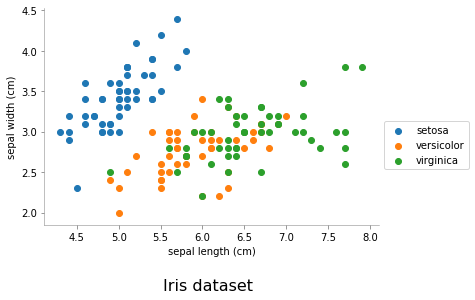

In [27]:
from sklearn.datasets import load_iris
IR = load_iris()
X = IR['data'][:,:2]
y = IR['target']
t_names = IR['target_names']
f_names = IR['feature_names']
fig, ax = plt.subplots()
ax.scatter(X[:,0][y==0],X[:,1][y==0], label=t_names[0])
ax.scatter(X[:,0][y==1],X[:,1][y==1], label=t_names[1])
ax.scatter(X[:,0][y==2],X[:,1][y==2], label=t_names[2])
ax.legend(bbox_to_anchor=(1,0.5));plt.xlabel(f_names[0]);
ax.set_ylabel(f_names[1]);
plt.figtext(0.4,-0.1,'Iris dataset',fontdict={'size':16});
format_axes(ax);
aa,bb,cc=0.5,1,10

In [28]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from matplotlib.colors import ListedColormap
from modAL import Committee
cmap_light = ListedColormap(['orange', 'cyan', 'cornflowerblue'])
cmap_bold = ListedColormap(['darkorange', 'c', 'darkblue'])
train_pool_X, test_X, train_pool_y, test_y = train_test_split(X, y, test_size=0.2, random_state=seed)
train_X, pool_X, train_y, pool_y = train_test_split(train_pool_X, train_pool_y, train_size=6, random_state=seed)
#clf = KNeighborsClassifier(n_neighbors=6, weights='distance')
#clf = SVC()
#clf.fit(train_X, train_y)

### dec
fig, ax = plt.subplots()
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
h = 0.02
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))
plt.close()
def get_Z(clf):
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    Z[0,0] = 0
    Z[Z.shape[0]-1,Z.shape[1]-1] = 1
    Z[0,1] = 2
    return Z

def plot_decision(Z, ax, i):
    ax.pcolormesh(xx, yy, Z, cmap=cmap_light)
    ax.scatter(pool_X[:, 0], pool_X[:, 1], c=pool_y, cmap=cmap_bold,
                    edgecolor='k', s=20, label='Pool set')
    ax.scatter([x[0] for x in list_new_x_iris[:i]],
               [x[1] for x in list_new_x_iris[:i]], 
               c=np.array(list_new_y_iris[:i]), cmap=cmap_bold,
                    edgecolor='k', s=100, label='Points to query')
    return ax

In [29]:
# al = lambda x: ActiveLearner(estimator=KNeighborsClassifier(n_neighbors=x, weights='distance'),
#                        X_training=train_X, y_training=train_y)
al = lambda x: ActiveLearner(estimator=SVC(C=x, probability=True, random_state=seed, kernel='rbf'),
                        X_training=train_X, y_training=train_y)

committee = Committee(learner_list=[al(aa), al(bb), al(cc)])

In [30]:
list_pred_y_iris = {i:[] for i in range(3)}
list_pred_all_iris = []
list_Z_iris = {i:[] for i in range(3)}
list_new_x_iris = []
list_new_y_iris = []
N = 30
committee.fit(train_X, train_y)
pool_X_tmp, pool_y_tmp = pool_X.copy(), pool_y.copy()
for i in range(N):
    print(i)
    clear_output(wait=True)
    list_pred_all_iris.append(committee.predict(test_X))
    for l_i, learner in enumerate(committee):
        list_pred_y_iris[l_i].append(learner.predict(test_X))
        list_Z_iris[l_i].append(get_Z(learner))
    new_ind, new_X = committee.query(pool_X_tmp, 1)
    list_new_x_iris.append(new_X[0])
    list_new_y_iris.append(pool_y_tmp[new_ind][0])
    committee.teach(new_X, pool_y_tmp[new_ind])
    pool_X_tmp, pool_y_tmp = np.delete(pool_X_tmp, new_ind, axis=0), np.delete(pool_y_tmp, new_ind, axis=0)
    
clear_output()

In [31]:
rand_pred_all_iris = []
rand_new_x_iris = []
rand_new_y_iris = []
al = lambda x: ActiveLearner(estimator=SVC(C=x, probability=True, random_state=seed),
                        X_training=train_X, y_training=train_y)
np.random.seed(seed)
committee = Committee(learner_list=[al(aa), al(bb), al(cc)])

#N = 20
committee.fit(train_X, train_y)
pool_X_tmp, pool_y_tmp = pool_X.copy(), pool_y.copy()
for i in range(N):
    print(i)
    clear_output(wait=True)
    rand_pred_all_iris.append(committee.predict(test_X))
    new_ind = [np.random.choice(range(len(pool_X_tmp)))]
    new_X = pool_X_tmp[new_ind]
    rand_new_x_iris.append(new_X[0])
    rand_new_y_iris.append(pool_y_tmp[new_ind[0]])
    committee.teach(new_X, pool_y_tmp[new_ind])
    pool_X_tmp, pool_y_tmp = np.delete(pool_X_tmp, new_ind, axis=0), np.delete(pool_y_tmp, new_ind, axis=0)
    
clear_output()

In [32]:
fig = plt.figure(figsize=(12,8))
ax = np.zeros((2,3)).astype(np.object)
ij = 1
for i in range(2):
    ax[i, 0]=fig.add_subplot(2,3,ij);ij+=1;
    ax[i, 1] = fig.add_subplot(2,3,ij);ij+=1;
    ax[i, 2] = fig.add_subplot(2,3,ij);ij+=1;
plt.subplots_adjust(wspace=0.)
C_l = [aa,bb,cc]
def iter_iris(i):
    for ii in range(3):
        for jj in range(2):
            ax[jj,ii].cla()
            format_axes(ax[jj, ii]);
        plot_decision(list_Z_iris[ii][i], ax[0,ii],i+1)
        #ax[0,ii].annotate('Current',(list_new_x_iris[i-1][0], list_new_x_iris[i-1][1]))
        ax[0,ii].set_xlabel(f_names[0]); ax[0,0].set_ylabel(f_names[1]);
        ax[0,ii].set_title('SVC with C: '+str(C_l[ii]))
        #ax[1,ii].grid(True)
        b_l = ax[1,ii].bar(t_names, individual_acc(list_pred_y_iris[ii][i]))
        #ax[1,ii].set_title(str(individual_acc(list_pred_y_iris[ii][i])))
        b_l[0].set_color('orange')
        b_l[1].set_color('cyan')
        b_l[2].set_color('cornflowerblue')
        ax[0, ii].legend(loc='lower left')
        ax[1, ii].set_ylim(0,1)
        ax[0, ii].set_ylim(0.5,5.5)
        ax[1, 0].set_yticks(np.linspace(0,1,11))
        ax[1, 1].set_yticks(())
        ax[1, 2].set_yticks(())
        ax[0, 1].set_yticks(())
        ax[0, 2].set_yticks(())
        ax[1, 0].set_ylabel('F1-score on test set')
        #ax[1, 0].legend(['F1-score on test set'])

#plt.tight_layout()
plt.close()
anim = FuncAnimation(fig, iter_iris, frames=range(N))
rc('animation', html='jshtml')
anim

Points queried by the committee are the points where learners disagree the most. This can be observed from the above plot. We can see that initially, all models learn different decision boundaries for the same data. Iteratively they converge to a similar hypothesis and thus start learning similar decision boundaries.

We now show the comparison of the overall F1-score between random baseline and our model. QBC, most of the time, outperforms the random baseline.

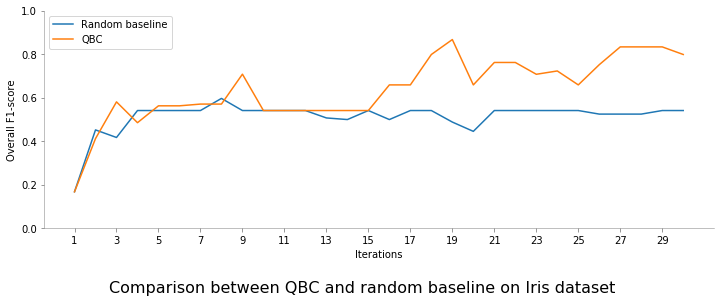

In [33]:
fig, ax = plt.subplots(figsize=(12,4))
ax.plot(range(1,1+len(rand_pred_all_iris)), overall_acc(rand_pred_all_iris), label='Random baseline')
ax.plot(range(1,1+len(rand_pred_all_iris)), overall_acc(list_pred_all_iris), label='QBC')
ax.legend();ax.set_xlabel('Iterations');ax.set_ylabel('Overall F1-score');
ax.set_ylim(0,1)
plt.figtext(0.2,-0.1,'Comparison between QBC and random baseline on Iris dataset',fontdict={'size':16});
format_axes(ax);

plt.xticks(np.arange(1,1+len(rand_pred_all_iris),2));

## Few More Active Learning Strategies

There are few more Active Learning techniques we are not covering here constrained to space and time. But we describe them in brief here:
1. Expected model change: Selecting the samples which would have the greatest change in the model.
1. Expected error reduction: Selecting the samples likely to reduce the generalization error of the model.
1. Variance reduction: Selecting samples that may help reduce output variance.

With this, we complete the visual tour to Active Learning techniques.

## References

1. Settles, Burr. Active learning literature survey. University of Wisconsin-Madison Department of Computer Sciences, 2009.
1. Danka, Tivadar, and Peter Horvath. "modAL: A modular active learning framework for Python." arXiv preprint arXiv:1805.00979 (2018).